In [1]:
import pandas as pd
import numpy as np
from nltk.corpus import stopwords


In [2]:
df = pd.read_excel('database.xlsx', index_col=0)
df

,Tech,Non-Tech,Total raised,Description,Primary Industry Sector,Primary Industry Group,Verticals,Universe,Revenue,Financing Status Note,...,HQ Location,Active Investors,Company Financing Status,Ownership Status,Website,Primary Contact,Primary Contact Title,Primary Contact Email,Primary Contact Phone,Tech Type
Company Name,,,,,,,,,,,,,,,,,,,,,
ABW Solar PV Facilities,1,0,NaN,A portfolio of 50MW solar power project locate...,Energy,"Exploration, Production and Refining","CleanTech, Infrastructure, LOHAS & Wellness",Private Equity,NaN,The ABW Solar PV Facilities was acquired by Ax...,...,"Amherstburg, Canada",Axium Infrastructure,Private Equity-Backed,Acquired/Merged,NaN,NaN,NaN,NaN,NaN,Disruptive Tech
Canopy Growth (TSE: WEED),1,0,244.22,Manufacturer and distributor of cannabis based...,Healthcare,Pharmaceuticals and Biotechnology,"Cannabis, LOHAS & Wellness, Manufacturing","M&A, Publicly Listed",60.72,The company received CAD 244.99 million of dev...,...,"Smiths Falls, Canada",Constellation Brands,Corporate Backed or Acquired,Publicly Held,www.canopygrowth.com,Mark Zekulin,President & Co-Chief Executive Officer,mark@tweed.com,+1 (855) 558-9333,Current Tech
GreenSpace Brands (TSX: JTR),0,1,7.00,Provider of natural food products in Canada.,Consumer Products and Services (B2C),Consumer Non-Durables,NaN,Publicly Listed,43.86,The company raised $7 million in a secondary p...,...,"Toronto, Canada",NaN,Corporation,Publicly Held,www.greenspacebrands.ca,Matthew Teichman,Chief Executive Officer & President,NaN,+1 (416) 934-5034,Non Tech
GreenBank Capital (CNQ: GBC),0,1,0.28,Owner and operator of an investment company. T...,Financial Services,Capital Markets/Institutions,Oil & Gas,"M&A, Publicly Listed",NaN,The company (CSE: GBC; OTCMKTS: GRNBF) receive...,...,"Toronto, Canada","Castle Resources, Individual Investor, Sammiri...",Corporate Backed or Acquired,Publicly Held,www.greenbankcapitalinc.com,Mark Wettreich,Director & Vice President,mw@greenbankcapitalinc.com,+1 (647) 931-9768,Non Tech
Grenville Strategic Royalty,0,1,21.79,Provider of royalty based financing services i...,Financial Services,Other Financial Services,NaN,"M&A, Publicly Listed",-3.25,The company was acquired by LOGiQ Asset Manage...,...,"Toronto, Canada",NaN,Corporate Backed or Acquired,Acquired/Merged,www.grenvillesrc.com,Donnacha Rahill,Chief Financial Officer,donnacha@grenvillesrc.com,+1 (416) 583-2300,Non Tech
WPT Industrial REIT (TSE: WIR.U),0,1,198.80,Owner and operator of industrial real estate p...,Financial Services,Other Financial Services,NaN,"Private Equity, Publicly Listed",84.83,The company raised $60 million in its initial ...,...,"Toronto, Canada",Alberta Investment Management,Private Equity-Backed,Publicly Held,investors.wptreit.com,Scott Frederiksen,Chief Executive Officer,stf@wptreit.com,+ 1(952) 897-7737,Non Tech
Open Source Health (CNQ: OSH),1,0,2.45,"Developer of cloud based, real-time precision ...",Healthcare,Healthcare Technology Systems,"HealthTech, SaaS","M&A, Publicly Listed, Venture Capital",NaN,The company (TSX: OSH) received CAD 1.55 milli...,...,"Toronto, Canada",Cybernorth Ventures,Corporate Backed or Acquired,Publicly Held,www.opensourcehealth.com,Arvin Ramos,Chief Financial Officer,aramos@opensourcehealth.com,NaN,Disruptive Tech
CHC Student Housing (TSX: CHC),0,1,0.95,Provider of student housing properties. The co...,Business Products and Services (B2B),Other Business Products and Services,NaN,"M&A, Publicly Listed",3.84,The company (TSX: CHC) was in talks to be acqu...,...,"Toronto, Canada",NaN,Corporation,Publicly Held,www.chcstudenthousing.com,Robert Waxman,Chief Financial Officer,waxman@chcrealty.ca,+1 (647) 288-9375,Non Tech
Blockchain Power Trust (TSX: BPWR.UN),1,0,39.58,Operator of renewable energy assets in Romania...,Energy,"Exploration, Production and Refining",CleanTech,"M&A, Publicly Listed",11.37,The company (TSXV:TEP.UN) received CAD 43.223 ...,...,"Toronto, Canada",NaN,Corporate Backed or Acquired,Publicly Held,www.bloc

In [3]:
df

,Tech,Non-Tech,Total raised,Description,Primary Industry Sector,Primary Industry Group,Verticals,Universe,Revenue,Financing Status Note,...,HQ Location,Active Investors,Company Financing Status,Ownership Status,Website,Primary Contact,Primary Contact Title,Primary Contact Email,Primary Contact Phone,Tech Type
Company Name,,,,,,,,,,,,,,,,,,,,,
ABW Solar PV Facilities,1,0,NaN,A portfolio of 50MW solar power project locate...,Energy,"Exploration, Production and Refining","CleanTech, Infrastructure, LOHAS & Wellness",Private Equity,NaN,The ABW Solar PV Facilities was acquired by Ax...,...,"Amherstburg, Canada",Axium Infrastructure,Private Equity-Backed,Acquired/Merged,NaN,NaN,NaN,NaN,NaN,Disruptive Tech
Canopy Growth (TSE: WEED),1,0,244.22,Manufacturer and distributor of cannabis based...,Healthcare,Pharmaceuticals and Biotechnology,"Cannabis, LOHAS & Wellness, Manufacturing","M&A, Publicly Listed",60.72,The company received CAD 244.99 million of dev...,...,"Smiths Falls, Canada",Constellation Brands,Corporate Backed or Acquired,Publicly Held,www.canopygrowth.com,Mark Zekulin,President & Co-Chief Executive Officer,mark@tweed.com,+1 (855) 558-9333,Current Tech
GreenSpace Brands (TSX: JTR),0,1,7.00,Provider of natural food products in Canada.,Consumer Products and Services (B2C),Consumer Non-Durables,NaN,Publicly Listed,43.86,The company raised $7 million in a secondary p...,...,"Toronto, Canada",NaN,Corporation,Publicly Held,www.greenspacebrands.ca,Matthew Teichman,Chief Executive Officer & President,NaN,+1 (416) 934-5034,Non Tech
GreenBank Capital (CNQ: GBC),0,1,0.28,Owner and operator of an investment company. T...,Financial Services,Capital Markets/Institutions,Oil & Gas,"M&A, Publicly Listed",NaN,The company (CSE: GBC; OTCMKTS: GRNBF) receive...,...,"Toronto, Canada","Castle Resources, Individual Investor, Sammiri...",Corporate Backed or Acquired,Publicly Held,www.greenbankcapitalinc.com,Mark Wettreich,Director & Vice President,mw@greenbankcapitalinc.com,+1 (647) 931-9768,Non Tech
Grenville Strategic Royalty,0,1,21.79,Provider of royalty based financing services i...,Financial Services,Other Financial Services,NaN,"M&A, Publicly Listed",-3.25,The company was acquired by LOGiQ Asset Manage...,...,"Toronto, Canada",NaN,Corporate Backed or Acquired,Acquired/Merged,www.grenvillesrc.com,Donnacha Rahill,Chief Financial Officer,donnacha@grenvillesrc.com,+1 (416) 583-2300,Non Tech
WPT Industrial REIT (TSE: WIR.U),0,1,198.80,Owner and operator of industrial real estate p...,Financial Services,Other Financial Services,NaN,"Private Equity, Publicly Listed",84.83,The company raised $60 million in its initial ...,...,"Toronto, Canada",Alberta Investment Management,Private Equity-Backed,Publicly Held,investors.wptreit.com,Scott Frederiksen,Chief Executive Officer,stf@wptreit.com,+ 1(952) 897-7737,Non Tech
Open Source Health (CNQ: OSH),1,0,2.45,"Developer of cloud based, real-time precision ...",Healthcare,Healthcare Technology Systems,"HealthTech, SaaS","M&A, Publicly Listed, Venture Capital",NaN,The company (TSX: OSH) received CAD 1.55 milli...,...,"Toronto, Canada",Cybernorth Ventures,Corporate Backed or Acquired,Publicly Held,www.opensourcehealth.com,Arvin Ramos,Chief Financial Officer,aramos@opensourcehealth.com,NaN,Disruptive Tech
CHC Student Housing (TSX: CHC),0,1,0.95,Provider of student housing properties. The co...,Business Products and Services (B2B),Other Business Products and Services,NaN,"M&A, Publicly Listed",3.84,The company (TSX: CHC) was in talks to be acqu...,...,"Toronto, Canada",NaN,Corporation,Publicly Held,www.chcstudenthousing.com,Robert Waxman,Chief Financial Officer,waxman@chcrealty.ca,+1 (647) 288-9375,Non Tech
Blockchain Power Trust (TSX: BPWR.UN),1,0,39.58,Operator of renewable energy assets in Romania...,Energy,"Exploration, Production and Refining",CleanTech,"M&A, Publicly Listed",11.37,The company (TSXV:TEP.UN) received CAD 43.223 ...,...,"Toronto, Canada",NaN,Corporate Backed or Acquired,Publicly Held,www.bloc

In [4]:
index = df.index
columns = df.columns
values = df.values

In [5]:
X = df[['Description', 'Primary Industry Sector']]
df.dropna(subset=['Description'], inplace=True)

In [6]:
pd.set_option('display.max_rows', 1100)
print(X)

                                                                                          Description  \
Company Name                                                                                            
ABW Solar PV Facilities                             A portfolio of 50MW solar power project locate...   
Canopy Growth (TSE: WEED)                           Manufacturer and distributor of cannabis based...   
GreenSpace Brands (TSX: JTR)                             Provider of natural food products in Canada.   
GreenBank Capital (CNQ: GBC)                        Owner and operator of an investment company. T...   
Grenville Strategic Royalty                         Provider of royalty based financing services i...   
WPT Industrial REIT (TSE: WIR.U)                    Owner and operator of industrial real estate p...   
Open Source Health (CNQ: OSH)                       Developer of cloud based, real-time precision ...   
CHC Student Housing (TSX: CHC)                      Pro

In [7]:
#Make Corpus

X = df['Description']
descriptions = X.tolist()

def make_corpus(text_list):
    from collections import Counter
    words = []
    for item in text_list:
        words += item.split(" ")

    for i in range(len(words)):
        if not words[i].isalpha():
            words[i] = ""
        else: words[i] = words[i].lower()

    filtered_words = [word for word in words if word not in stopwords.words('english')]    
    dictionary = Counter(filtered_words)
    del dictionary[""]
    dictionary = dictionary.most_common(3000)
    return dictionary

dictionary = make_corpus(descriptions)
dictionary

[('enabling', 630),
 ('platform', 571),
 ('provider', 454),
 ('company', 418),
 ('developer', 391),
 ('designed', 353),
 ('services', 239),
 ('intended', 225),
 ('offers', 203),
 ('application', 202),
 ('users', 200),
 ('data', 199),
 ('online', 189),
 ('management', 172),
 ('mobile', 162),
 ('operator', 158),
 ('software', 157),
 ('provides', 140),
 ('technology', 134),
 ('digital', 122),
 ('medical', 119),
 ('based', 101),
 ('products', 99),
 ('help', 99),
 ('business', 95),
 ('businesses', 93),
 ('health', 88),
 ('helps', 88),
 ('provide', 83),
 ('cannabis', 82),
 ('system', 79),
 ('get', 78),
 ('companies', 77),
 ('marketing', 77),
 ('social', 77),
 ('development', 76),
 ('customers', 75),
 ('using', 73),
 ('clients', 71),
 ('patients', 71),
 ('create', 70),
 ('manage', 70),
 ('include', 68),
 ('service', 68),
 ('access', 68),
 ('content', 66),
 ('uses', 66),
 ('connect', 66),
 ('real', 65),
 ('created', 64),
 ('time', 64),
 ('offer', 64),
 ('develops', 63),
 ('product', 63),
 ('fi

In [8]:
def make_feature_vectors(dictionary, text_list):

    #set up variables
    feature_set = []
    labels = []
    c = len(text_list) #simple counter

    #go through all documents
    for text in text_list:
        text = text.lower()
        data = []

        #make the feature vector for the document
        words = text.split(" ")
        for entry in dictionary:
            data.append(words.count(entry[0]))
        feature_set.append(data)
        
    return feature_set


features = make_feature_vectors(dictionary, descriptions)

#check to see that the feature set matches the number of labels
# print(len(features))
features

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  2,
  3,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


In [9]:
L = df['Tech']
labels = L.tolist()


In [10]:
from sklearn.model_selection import train_test_split as tts
x_train, x_test, y_train, y_test = tts(features, labels, test_size = 0.2, random_state=10, stratify=labels) #stratifying reduces preformance?

In [11]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import roc_auc_score

clf = MultinomialNB(alpha=0.16)
clf.fit(x_train, y_train)

y_train_pred = cross_val_predict(clf, x_train, y_train, cv=3)
print(f1_score(y_train, y_train_pred))
print(roc_auc_score(y_train, y_train_pred))


# from sklearn.model_selection import cross_val_score
# #clf = svm.SVC(kernel='linear', C=1)
# scores = cross_val_score(clf, x_test, y_test, cv=5)
# scores  
# print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

0.908955223880597
0.8322940951042698


In [12]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import roc_curve, precision_recall_curve, auc, make_scorer, recall_score, accuracy_score, precision_score, confusion_matrix
import matplotlib.pyplot as plt


alphas = [0.02, 0.05, 0.07, 0.1, 0.12, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3]
param_grid = dict(alpha=alphas)
# param_grid
grid = GridSearchCV(clf, param_grid, cv=10, scoring='roc_auc')
grid.fit(x_train, y_train)


GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=MultinomialNB(alpha=0.16, class_prior=None, fit_prior=True),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'alpha': [0.02, 0.05, 0.07, 0.1, 0.12, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=0)

In [13]:
import sklearn
sorted(sklearn.metrics.SCORERS.keys())

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'brier_score_loss',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'mutual_info_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'normalized_mutual_info_score',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',
 'roc_auc',
 'v_measure_score']

[0.91461325 0.92461654 0.92733748 0.92917915 0.92925556 0.92981077
 0.93021197 0.92989172 0.92973148 0.92940359 0.92964072 0.92964072
 0.92971785 0.92995498 0.92979115 0.92962709 0.9294702  0.92955044
 0.9296235  0.92930302 0.92962374 0.92978087]


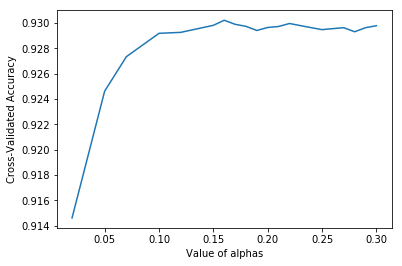

0.9302119659924751
{'alpha': 0.16}
MultinomialNB(alpha=0.16, class_prior=None, fit_prior=True)


In [14]:
# print the array of mean scores only
grid_mean_scores = grid.cv_results_['mean_test_score']
print(grid_mean_scores)
# plot the results
plt.plot(alphas, grid_mean_scores)
plt.xlabel('Value of alphas')
plt.ylabel('Cross-Validated Accuracy')
plt.show()

# examine the best model
print(grid.best_score_)
print(grid.best_params_)
print(grid.best_estimator_)

/anaconda2/envs/book/lib/python3.6/site-packages/sklearn/linear_model/stochastic_gradient.py:166: FutureWarning: max_iter and tol parameters have been added in SGDClassifier in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  FutureWarning)
/anaconda2/envs/book/lib/python3.6/site-packages/sklearn/linear_model/stochastic_gradient.py:166: FutureWarning: max_iter and tol parameters have been added in SGDClassifier in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  FutureWarning)
/anaconda2/envs/book/lib/python3.6/site-packages/sklearn/linear_model/stochastic_gradient.py:166: FutureWarning: max_iter and tol parameters have been added in SGDClassifier in 0.19. If both are left unset, they de


0.9069935111751982
0.917310701625523

0.9050359712230216
0.9089595375722543


/anaconda2/envs/book/lib/python3.6/site-packages/sklearn/linear_model/stochastic_gradient.py:166: FutureWarning: max_iter and tol parameters have been added in SGDClassifier in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  FutureWarning)


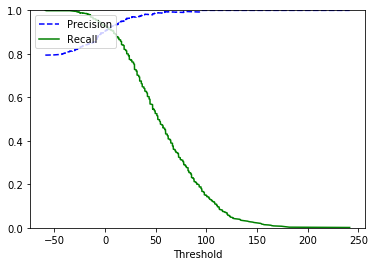

In [15]:
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score

clf = SGDClassifier()
clf.fit(x_train, y_train)
preds = clf.predict(x_test)

#-------------
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import f1_score
# get predictions
from sklearn.model_selection import cross_val_predict
y_train_pred = cross_val_predict(clf, x_train, y_train, cv=3)
y_scores = cross_val_predict(clf, x_train, y_train, cv=3, method="decision_function") 

print()
print(f1_score(y_train, y_train_pred))
print(roc_auc_score(y_train, y_scores))

print()
y_scores = cross_val_predict(clf, x_train, y_train, cv=3, method="decision_function") 
# To make this decision we looked at teh PR graph and noted that if we wanted about an 85% precision we would need a threshold of 150,000.
print(precision_score(y_train, y_train_pred)) # == TP / (TP + FP) 
print(recall_score(y_train, y_train_pred)) # == TP / (TP + FN)

#plot preciosion recall curve
precisions, recalls, thresholds = precision_recall_curve(y_train, y_scores)
def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
    plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.ylim([0, 1])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()

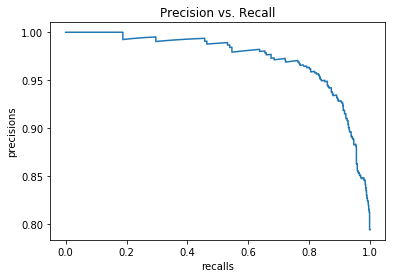

In [16]:
def plot_PvsR_curve(precisions, recalls):
    plt.title("Precision vs. Recall")
    plt.plot(recalls, precisions)
    plt.xlabel('recalls')
    plt.ylabel('precisions')
precisions, recalls, thresholds = precision_recall_curve(y_train, y_scores)
plot_PvsR_curve(precisions, recalls)

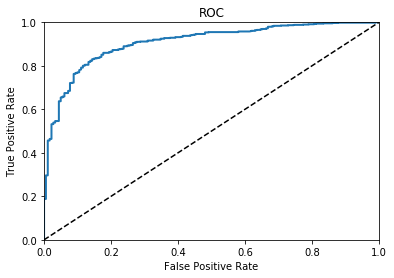

0.9078258231405487


In [17]:
# ----------------- ROC GRAPH -----------------
# ROC curve (receiver operating characteristic)
# true positive rate versus false positive rate
# dotted line represents a random classifier. A good algorithm stays as far away from that as possible to the top left corner.
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_train, y_scores)

def plot_roc_curve(fpr, tpr, label=None):
    plt.title("ROC")
    plt.plot(fpr, tpr, linewidth=2, label=label)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([0, 1, 0, 1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
plot_roc_curve(fpr, tpr)
plt.show()

# quantify this curve in one number by calculating the area under the curve. Perfect classifier would be = 1
from sklearn.metrics import roc_auc_score
print(roc_auc_score(y_train, y_scores))
